# Data discovery, Cleaning and Feature Engineering

In [1]:
import pandas as pd

pd.set_option("display.max_columns", 10)
pd.set_option("display.max_rows", 50)
pd.set_option("plotting.backend", "plotly")

## Data discovery

In [2]:
file_path = "./../input/olist_"
file_end = "_dataset.csv"
customers = pd.read_csv("{0}customers{1}".format(file_path, file_end))
geolocation = pd.read_csv("{0}geolocation{1}".format(file_path, file_end))
order_items = pd.read_csv(
    "{0}order_items{1}".format(file_path, file_end), parse_dates=["shipping_limit_date"]
)
order_payments = pd.read_csv("{0}order_payments{1}".format(file_path, file_end))
order_reviews = pd.read_csv(
    "{0}order_reviews{1}".format(file_path, file_end),
    parse_dates=[
        "review_creation_date",
        "review_answer_timestamp",
    ],
)
orders = pd.read_csv(
    "{0}orders{1}".format(file_path, file_end),
    parse_dates=[
        "order_purchase_timestamp",
        "order_approved_at",
        "order_delivered_carrier_date",
        "order_delivered_customer_date",
        "order_estimated_delivery_date",
    ],
)
products = pd.read_csv("{0}products{1}".format(file_path, file_end))
sellers = pd.read_csv("{0}sellers{1}".format(file_path, file_end))

product_category_name_translation = pd.read_csv(
    "./../input/product_category_name_translation.csv".format(file_path)
)

In [3]:
print(
    "There are {0} unique customers.".format(len(customers.customer_unique_id.unique()))
)
print(customers.info())

customers

There are 96096 unique customers.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB
None


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [4]:
print(geolocation.info())
geolocation

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB
None


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


In [5]:
print(order_items.info())
order_items

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB
None


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


In [6]:
print(order_payments.info())
order_payments

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB
None


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [7]:
print(order_reviews.info())
order_reviews

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB
None


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01,2018-07-02 12:59:13


In [8]:
print(orders.info())
orders

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB
None


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15


In [9]:
print(products.info())
products

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB
None


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [10]:
print(sellers.info())
sellers

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB
None


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


### Improving Data types

Some variables are wrongly interpreted by pandas, let's improve it.

* Zip Codes are string values ;
* All identifiers are strings (even if it's only built from numbers) ;
* Reduce size of variables (optimized types) ;

In [11]:
customers["customer_zip_code_prefix"] = customers["customer_zip_code_prefix"].astype(
    "object"
)
sellers["seller_zip_code_prefix"] = sellers["seller_zip_code_prefix"].astype("object")
geolocation["geolocation_zip_code_prefix"] = geolocation[
    "geolocation_zip_code_prefix"
].astype("object")

In [12]:
order_items["order_item_id"] = order_items["order_item_id"].astype("object")

In [13]:
# https://medium.com/bigdatarepublic/advanced-pandas-optimize-speed-and-memory-a654b53be6c2
from typing import List


def optimize_floats(df: pd.DataFrame) -> pd.DataFrame:
    """Optimize floats to the best data type

    Args:
        df (pd.DataFrame): A DataFrame

    Returns:
        pd.DataFrame: An optimized DataFrame
    """
    floats = df.select_dtypes(include=["float64"]).columns.tolist()
    df[floats] = df[floats].apply(pd.to_numeric, downcast="float")
    return df


def optimize_ints(df: pd.DataFrame) -> pd.DataFrame:
    """Optimize ints to the best data type

    Args:
        df (pd.DataFrame): A DataFrame

    Returns:
        pd.DataFrame: An optimized DataFrame
    """
    ints = df.select_dtypes(include=["int64"]).columns.tolist()
    df[ints] = df[ints].apply(pd.to_numeric, downcast="integer")
    return df


def optimize_objects(df: pd.DataFrame, datetime_features: List[str]) -> pd.DataFrame:
    """Optimize objects variables when it's possible

    Args:
        df (pd.DataFrame): A DataFrame
        datetime_features (List[str]): The list of datetime features

    Returns:
        pd.DataFrame: An optimized DataFrame
    """
    for col in df.select_dtypes(include=["object"]):
        if col not in datetime_features:
            if not (type(df[col][0]) == list):
                num_unique_values = len(df[col].unique())
                num_total_values = len(df[col])
                if float(num_unique_values) / num_total_values < 0.5:
                    df[col] = df[col].astype("category")
        else:
            df[col] = pd.to_datetime(df[col])
    return df


def optimize(df: pd.DataFrame, datetime_features: List[str] = []) -> pd.DataFrame:
    """Meta function to optimize all the DataFrames

    Args:
        df (pd.DataFrame): A DataFrame
        datetime_features (List[str], optional): The list of datetime features. Defaults to [].

    Returns:
        pd.DataFrame: [description]
    """
    return optimize_floats(optimize_ints(optimize_objects(df, datetime_features)))

In [14]:
customers = optimize(customers)
geolocation = optimize(geolocation)
order_items = optimize(order_items)
order_payments = optimize(order_payments)
order_reviews = optimize(order_reviews)
orders = optimize(orders)
products = optimize(products)
sellers = optimize(sellers)

In [15]:
print(customers.info())
print(geolocation.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   customer_id               99441 non-null  object  
 1   customer_unique_id        99441 non-null  object  
 2   customer_zip_code_prefix  99441 non-null  category
 3   customer_city             99441 non-null  category
 4   customer_state            99441 non-null  category
dtypes: category(3), object(2)
memory usage: 2.8+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype   
---  ------                       --------------    -----   
 0   geolocation_zip_code_prefix  1000163 non-null  category
 1   geolocation_lat              1000163 non-null  float32 
 2   geolocation_lng              1000163 non-null  float32 
 3   geolocation_city    

In [16]:
print(order_items.info())
print(order_payments.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  category      
 2   product_id           112650 non-null  category      
 3   seller_id            112650 non-null  category      
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float32       
 6   freight_value        112650 non-null  float32       
dtypes: category(3), datetime64[ns](1), float32(2), object(1)
memory usage: 4.7+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   order_id              103886 non-null  object  
 1   payme

In [17]:
print(order_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int8          
 3   review_comment_title     11568 non-null  category      
 4   review_comment_message   40977 non-null  category      
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: category(2), datetime64[ns](2), int8(1), object(2)
memory usage: 5.1+ MB
None


In [18]:
print(orders.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  category      
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: category(1), datetime64[ns](5), object(2)
memory usage: 5.4+ MB
None


In [19]:
print(products.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   product_id                  32951 non-null  object  
 1   product_category_name       32341 non-null  category
 2   product_name_lenght         32341 non-null  float32 
 3   product_description_lenght  32341 non-null  float32 
 4   product_photos_qty          32341 non-null  float32 
 5   product_weight_g            32949 non-null  float32 
 6   product_length_cm           32949 non-null  float32 
 7   product_height_cm           32949 non-null  float32 
 8   product_width_cm            32949 non-null  float32 
dtypes: category(1), float32(7), object(1)
memory usage: 1.2+ MB
None


In [20]:
print(sellers.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   seller_id               3095 non-null   object  
 1   seller_zip_code_prefix  3095 non-null   object  
 2   seller_city             3095 non-null   category
 3   seller_state            3095 non-null   category
dtypes: category(2), object(2)
memory usage: 79.2+ KB
None


### Missing values

Some data frames contains null values :

* `order_reviews`
* `orders`
* `products`

Let's investigate a little bit !

#### Order reviews

In [21]:
order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int8          
 3   review_comment_title     11568 non-null  category      
 4   review_comment_message   40977 non-null  category      
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: category(2), datetime64[ns](2), int8(1), object(2)
memory usage: 5.1+ MB


It look likes a complete entry is done every time a customer add a score to a product,
but they don't have to fill a title or a message.

Surprisingly, even when the customers fill a message they are not forced to fill a title.

We can complete these variables with empty value : this wont break anything neither change the statistics about title and message from a NLP point of view.

Also, these variables _shouldn't be categorical_...

In [22]:
order_reviews["review_comment_title"] = order_reviews["review_comment_title"].astype(
    "object"
)
order_reviews["review_comment_message"] = order_reviews[
    "review_comment_message"
].astype("object")

order_reviews.loc[
    order_reviews.review_comment_title.isna(), "review_comment_title"
] = ""
order_reviews.loc[
    order_reviews.review_comment_message.isna(), "review_comment_message"
] = ""

order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int8          
 3   review_comment_title     99224 non-null  object        
 4   review_comment_message   99224 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int8(1), object(4)
memory usage: 4.6+ MB


#### Orders

In [23]:
print(orders.info())
orders.describe(datetime_is_numeric=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  category      
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: category(1), datetime64[ns](5), object(2)
memory usage: 5.4+ MB
None


,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99281,97658,96476,99441
mean,2017-12-31 08:43:12.776581120,2017-12-31 18:35:24.098800128,2018-01-04 21:49:48.138278656,2018-01-14 12:09:19.035542272,2018-01-24 03:08:37.730111232
min,2016-09-04 21:15:19,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-09-30 00:00:00
25%,2017-09-12 14:46:19,2017-09-12 23:24:16,2017-09-15 22:28:50.249999872,2017-09-25 22:07:22.249999872,2017-10-03 00:00:00
50%,2018-01-18 23:04:36,2018-01-19 11:36:13,2018-01-24 16:10:58,2018-02-02 19:28:10.500000,2018-02-15 00:00:00
75%,2018-05-04 15:42:16,2018-05-04 20:35:10,2018-05-08 13:37:45,2018-05-15 22:48:52.249999872,2018-05-25 00:00:00
max,2018-10-17 17:30:18,2018-09-03 17:40:06,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-11-12 00:00:00


In [24]:
orders[["order_id", "order_status"]].groupby("order_status").count().sort_values(
    "order_id", ascending=False
).plot.bar(title="Orders by Order Status")

We will keep only the delivered orders as there is no enough data for the others statuses.

Then we will keep only lines where all data are available

In [25]:
orders = orders[orders["order_status"] == "delivered"]
orders.drop(columns=["order_status"], inplace=True)
orders = orders.dropna()
print(orders.info())
orders.describe(datetime_is_numeric=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96455 entries, 0 to 99440
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96455 non-null  object        
 1   customer_id                    96455 non-null  object        
 2   order_purchase_timestamp       96455 non-null  datetime64[ns]
 3   order_approved_at              96455 non-null  datetime64[ns]
 4   order_delivered_carrier_date   96455 non-null  datetime64[ns]
 5   order_delivered_customer_date  96455 non-null  datetime64[ns]
 6   order_estimated_delivery_date  96455 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(2)
memory usage: 5.9+ MB
None


C:\Users\micka\AppData\Local\Temp\ipykernel_23908\3941048050.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,96455,96455,96455,96455,96455
mean,2018-01-02 00:26:23.673806336,2018-01-02 10:43:03.401710592,2018-01-05 05:53:41.200134656,2018-01-14 13:49:28.328526336,2018-01-25 18:04:03.421284864
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00
25%,2017-09-14 09:39:02.500000,2017-09-14 14:42:23,2017-09-18 17:06:18.500000,2017-09-25 22:56:47,2017-10-05 00:00:00
50%,2018-01-20 20:00:12,2018-01-22 13:49:24,2018-01-24 16:28:58,2018-02-02 19:52:30,2018-02-16 00:00:00
75%,2018-05-05 18:53:33,2018-05-06 10:52:57.500000,2018-05-08 14:34:30,2018-05-15 23:09:15.500000,2018-05-28 00:00:00
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00


We removed almost 3% of the total `orders` data.

#### Products

In [26]:
print(products.info())
products.describe(datetime_is_numeric=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   product_id                  32951 non-null  object  
 1   product_category_name       32341 non-null  category
 2   product_name_lenght         32341 non-null  float32 
 3   product_description_lenght  32341 non-null  float32 
 4   product_photos_qty          32341 non-null  float32 
 5   product_weight_g            32949 non-null  float32 
 6   product_length_cm           32949 non-null  float32 
 7   product_height_cm           32949 non-null  float32 
 8   product_width_cm            32949 non-null  float32 
dtypes: category(1), float32(7), object(1)
memory usage: 1.2+ MB
None


,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476948,771.495239,2.188986,2276.472412,30.815079,16.937662,23.196728
std,10.245741,635.115234,1.736766,4282.038574,16.914457,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


In [27]:
undefined_category = "N/A"
products["product_category_name"].cat.add_categories([undefined_category], inplace=True)

products.loc[
    products["product_category_name"].isna(), "product_category_name"
] = undefined_category

C:\Users\micka\AppData\Local\Temp\ipykernel_23908\2988792094.py:2: FutureWarning:

The `inplace` parameter in pandas.Categorical.add_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.



In [28]:
products.loc[products.product_name_lenght.isna(), "product_name_lenght"] = 0
products.loc[
    products.product_description_lenght.isna(), "product_description_lenght"
] = 0
products.loc[products.product_photos_qty.isna(), "product_photos_qty"] = 0

In [29]:
print(products.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   product_id                  32951 non-null  object  
 1   product_category_name       32951 non-null  category
 2   product_name_lenght         32951 non-null  float32 
 3   product_description_lenght  32951 non-null  float32 
 4   product_photos_qty          32951 non-null  float32 
 5   product_weight_g            32949 non-null  float32 
 6   product_length_cm           32949 non-null  float32 
 7   product_height_cm           32949 non-null  float32 
 8   product_width_cm            32949 non-null  float32 
dtypes: category(1), float32(7), object(1)
memory usage: 1.2+ MB
None


In [30]:
# Only 2 values, let's use the mean of each product category : "bebes" and "N/A"
products[products.product_length_cm.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,N/A,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [31]:
baby_category = products[products.product_category_name == "bebes"][
    ["product_weight_g", "product_length_cm", "product_width_cm"]
].mean()
print(baby_category)

product_id = "09ff539a621711667c43eba6a3bd8466"
products.loc[products.product_id == product_id, "product_weight_g"] = baby_category[
    "product_weight_g"
]
products.loc[products.product_id == product_id, "product_length_cm"] = baby_category[
    "product_length_cm"
]
products.loc[products.product_id == product_id, "product_width_cm"] = baby_category[
    "product_width_cm"
]

products[products.product_length_cm.isna()]

product_weight_g     3655.201416
product_length_cm      37.147060
product_width_cm       28.717865
dtype: float32


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
18851,5eb564652db742ff8f28759cd8d2652a,N/A,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [32]:
na_category = products[products.product_category_name == "N/A"][
    ["product_weight_g", "product_length_cm", "product_width_cm"]
].mean()
print(na_category)

product_id = "5eb564652db742ff8f28759cd8d2652a"
products.loc[products.product_id == product_id, "product_weight_g"] = na_category[
    "product_weight_g"
]
products.loc[products.product_id == product_id, "product_length_cm"] = na_category[
    "product_length_cm"
]
products.loc[products.product_id == product_id, "product_width_cm"] = na_category[
    "product_width_cm"
]

products[products.product_length_cm.isna()]

product_weight_g     2250.765137
product_length_cm      28.719212
product_width_cm       22.566502
dtype: float32


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm


Ok, the dataset doesn't contains any null values anymore.

### Experiment 1 : RFM Clustering

When we want to do clustering on customer data, we can start with RFM :

* Recency : last date of order (or number of days since last order) ;
* Frequency : how many times the customer have ordered for a period of time ?
* Monetary : the amount spent by the customer ;

> We can calculate these behavioral features for each customer and try to do clustering using theses.

In [33]:
import numpy as np

# Add customerunique_id to orders
orders = orders.merge(
    customers[["customer_id", "customer_unique_id"]], on="customer_id", how="inner"
)

## Add total value of each order using order_items

orders_from_items = (
    order_items[["order_id", "price", "freight_value"]]
    .groupby("order_id")
    .sum()
    .reset_index()
)
orders_from_items["total_value"] = (
    orders_from_items["price"] + orders_from_items["freight_value"]
)

# https://github.com/pandas-dev/pandas/issues/35124
orders_from_items["total_value"] = orders_from_items["total_value"].astype(np.float64)
orders_from_items = orders_from_items.round(2)

orders_from_items = orders_from_items[["order_id", "total_value"]]

print(orders_from_items)

orders = orders.merge(orders_from_items, on="order_id", how="inner")

orders

                               order_id  total_value
0      00010242fe8c5a6d1ba2dd792cb16214        72.19
1      00018f77f2f0320c557190d7a144bdd3       259.83
2      000229ec398224ef6ca0657da4fc703e       216.87
3      00024acbcdf0a6daa1e931b038114c75        25.78
4      00042b26cf59d7ce69dfabb4e55b4fd9       218.04
...                                 ...          ...
98661  fffc94f6ce00a00581880bf54a75a037       343.40
98662  fffcd46ef2263f404302a634eb57f7eb       386.53
98663  fffce4705a9662cd70adb13d4a31832d       116.85
98664  fffe18544ffabc95dfada21779c9644f        64.71
98665  fffe41c64501cc87c801fd61db3f6244        55.79

[98666 rows x 2 columns]


,order_id,customer_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,total_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,28.62
...,...,...,...,...,...,...,...,...,...
96450,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,6359f309b166b0196dbf7ad2ac62bb5a,85.08
96451,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,da62f9e57a76d978d02ab5362c509660,195.00
96452,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,737520a9aad80b3fbbdad19b66b37b30,271.01
96453,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,5097a5312c8b157bb7be58ae360ef43c,441.16


We will consider the following :

* To define the **Recency**, "NOW" is the date of the last order ;
* The **Frequency** is based on the number of order per month since the first order ;
* The **Monetary** is the total spent by a customer ;

In [34]:
#
# Monetary
#

rfm = orders[
    ["customer_id", "order_purchase_timestamp", "customer_unique_id", "total_value"]
].copy()

rfm.rename(columns={"total_value": "monetary"}, inplace=True)
total_orders = (
    rfm[["customer_id", "customer_unique_id"]]
    .groupby("customer_unique_id")
    .count()
    .reset_index()
    .rename(columns={"customer_id": "nb_orders"})
)

total_orders["nb_orders"].hist(title="Orders distribution in the Dataset")

Eww, most of the customers doesn't order more than once !

This means that the frequency may be irrelevant to group our customers 🤔

In [35]:
# print(rfm.columns)
# print(total_orders.columns)
rfm = rfm.merge(total_orders, on="customer_unique_id", how="inner")

print(rfm["nb_orders"].value_counts(normalize=True))
rfm

1     0.938635
2     0.053331
3     0.005630
4     0.001161
5     0.000467
6     0.000311
7     0.000218
15    0.000156
9     0.000093
Name: nb_orders, dtype: float64


,customer_id,order_purchase_timestamp,customer_unique_id,monetary,nb_orders
0,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,38.71,2
1,31f31efcb333fcbad2b1371c8cf0fa84,2017-09-04 11:26:38,7c396fd4830fd04220f754e42b4e5bff,44.11,2
2,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46,1
3,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12,1
4,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,7c142cf63193a1473d2e66489a9ae977,72.20,1
...,...,...,...,...,...
96450,39bd1228ee8140590ac3aca26f2dfe00,2017-03-09 09:54:05,6359f309b166b0196dbf7ad2ac62bb5a,85.08,1
96451,1fca14ff2861355f6e5f14306ff977a7,2018-02-06 12:58:58,da62f9e57a76d978d02ab5362c509660,195.00,1
96452,1aa71eb042121263aafbe80c1b562c9c,2017-08-27 14:46:43,737520a9aad80b3fbbdad19b66b37b30,271.01,1
96453,b331b74b18dc79bcdf6532d51e1637c1,2018-01-08 21:28:27,5097a5312c8b157bb7be58ae360ef43c,441.16,1


we notice that customers with more than 2 orders represent less than 1% of our data, we will delete these outliers :

In [36]:
rfm = rfm.loc[rfm.nb_orders <= 2, :]

rfm

,customer_id,order_purchase_timestamp,customer_unique_id,monetary,nb_orders
0,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,38.71,2
1,31f31efcb333fcbad2b1371c8cf0fa84,2017-09-04 11:26:38,7c396fd4830fd04220f754e42b4e5bff,44.11,2
2,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46,1
3,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12,1
4,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,7c142cf63193a1473d2e66489a9ae977,72.20,1
...,...,...,...,...,...
96450,39bd1228ee8140590ac3aca26f2dfe00,2017-03-09 09:54:05,6359f309b166b0196dbf7ad2ac62bb5a,85.08,1
96451,1fca14ff2861355f6e5f14306ff977a7,2018-02-06 12:58:58,da62f9e57a76d978d02ab5362c509660,195.00,1
96452,1aa71eb042121263aafbe80c1b562c9c,2017-08-27 14:46:43,737520a9aad80b3fbbdad19b66b37b30,271.01,1
96453,b331b74b18dc79bcdf6532d51e1637c1,2018-01-08 21:28:27,5097a5312c8b157bb7be58ae360ef43c,441.16,1


In [37]:
#
# Recency
#

now = rfm.order_purchase_timestamp.max()

# For 1 order : first and last order are the same
# For 2 orders : first and last order should be different

first_order_per_customer = (
    rfm[["order_purchase_timestamp", "customer_unique_id"]]
    .groupby("customer_unique_id")
    .min()
    .reset_index()
    .rename(columns={"order_purchase_timestamp": "first_order"})
)
last_order_per_customer = (
    rfm[["order_purchase_timestamp", "customer_unique_id"]]
    .groupby("customer_unique_id")
    .max()
    .reset_index()
    .rename(columns={"order_purchase_timestamp": "last_order"})
)

rfm = rfm.merge(first_order_per_customer, on="customer_unique_id", how="inner")
rfm = rfm.merge(last_order_per_customer, on="customer_unique_id", how="inner")
rfm["recency"] = (now - rfm["last_order"]).dt.days + 1

rfm

,customer_id,order_purchase_timestamp,customer_unique_id,monetary,nb_orders,first_order,last_order,recency
0,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,38.71,2,2017-09-04 11:26:38,2017-10-02 10:56:33,332
1,31f31efcb333fcbad2b1371c8cf0fa84,2017-09-04 11:26:38,7c396fd4830fd04220f754e42b4e5bff,44.11,2,2017-09-04 11:26:38,2017-10-02 10:56:33,332
2,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46,1,2018-07-24 20:41:37,2018-07-24 20:41:37,36
3,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12,1,2018-08-08 08:38:49,2018-08-08 08:38:49,22
4,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,7c142cf63193a1473d2e66489a9ae977,72.20,1,2017-11-18 19:28:06,2017-11-18 19:28:06,284
...,...,...,...,...,...,...,...,...
95675,39bd1228ee8140590ac3aca26f2dfe00,2017-03-09 09:54:05,6359f309b166b0196dbf7ad2ac62bb5a,85.08,1,2017-03-09 09:54:05,2017-03-09 09:54:05,539
95676,1fca14ff2861355f6e5f14306ff977a7,2018-02-06 12:58:58,da62f9e57a76d978d02ab5362c509660,195.00,1,2018-02-06 12:58:58,2018-02-06 12:58:58,205
95677,1aa71eb042121263aafbe80c1b562c9c,2017-08-27 14:46:43,737520a9aad80b3fbbdad19b66b37b30,271.01,1,2017-08-27 14:46:43,2017-08-27 14:46:43,368
95678,b331b74b18dc79bcdf6532d51e1637c1,2018-01-08 21:28:27,5097a5312c8b157bb7be58ae360ef43c,441.16,1,2018-01-08 21:28:27,2018-01-08 21:28:27,233


In [38]:
#
# Frequency
#
max_order = rfm["last_order"].max()
rfm["months"] = round((max_order - rfm["first_order"]).dt.days / 30 + 1)
rfm["frequency"] = rfm["nb_orders"] / rfm["months"]

rfm

,customer_id,order_purchase_timestamp,customer_unique_id,monetary,nb_orders,first_order,last_order,recency,months,frequency
0,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,38.71,2,2017-09-04 11:26:38,2017-10-02 10:56:33,332,13.0,0.153846
1,31f31efcb333fcbad2b1371c8cf0fa84,2017-09-04 11:26:38,7c396fd4830fd04220f754e42b4e5bff,44.11,2,2017-09-04 11:26:38,2017-10-02 10:56:33,332,13.0,0.153846
2,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46,1,2018-07-24 20:41:37,2018-07-24 20:41:37,36,2.0,0.500000
3,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12,1,2018-08-08 08:38:49,2018-08-08 08:38:49,22,2.0,0.500000
4,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,7c142cf63193a1473d2e66489a9ae977,72.20,1,2017-11-18 19:28:06,2017-11-18 19:28:06,284,10.0,0.100000
...,...,...,...,...,...,...,...,...,...,...
95675,39bd1228ee8140590ac3aca26f2dfe00,2017-03-09 09:54:05,6359f309b166b0196dbf7ad2ac62bb5a,85.08,1,2017-03-09 09:54:05,2017-03-09 09:54:05,539,19.0,0.052632
95676,1fca14ff2861355f6e5f14306ff977a7,2018-02-06 12:58:58,da62f9e57a76d978d02ab5362c509660,195.00,1,2018-02-06 12:58:58,2018-02-06 12:58:58,205,8.0,0.125000
95677,1aa71eb042121263aafbe80c1b562c9c,2017-08-27 14:46:43,737520a9aad80b3fbbdad19b66b37b30,271.01,1,2017-08-27 14:46:43,2017-08-27 14:46:43,368,13.0,0.076923
95678,b331b74b18dc79bcdf6532d51e1637c1,2018-01-08 21:28:27,5097a5312c8b157bb7be58ae360ef43c,441.16,1,2018-01-08 21:28:27,2018-01-08 21:28:27,233,9.0,0.111111


In [39]:
# Fix the monetary

rfm = rfm[
    [
        "customer_unique_id",
        "recency",
        "frequency",
        "monetary",
        "nb_orders",
        "first_order",
        "last_order",
    ]
]

rfm

,customer_unique_id,recency,frequency,monetary,nb_orders,first_order,last_order
0,7c396fd4830fd04220f754e42b4e5bff,332,0.153846,38.71,2,2017-09-04 11:26:38,2017-10-02 10:56:33
1,7c396fd4830fd04220f754e42b4e5bff,332,0.153846,44.11,2,2017-09-04 11:26:38,2017-10-02 10:56:33
2,af07308b275d755c9edb36a90c618231,36,0.500000,141.46,1,2018-07-24 20:41:37,2018-07-24 20:41:37
3,3a653a41f6f9fc3d2a113cf8398680e8,22,0.500000,179.12,1,2018-08-08 08:38:49,2018-08-08 08:38:49
4,7c142cf63193a1473d2e66489a9ae977,284,0.100000,72.20,1,2017-11-18 19:28:06,2017-11-18 19:28:06
...,...,...,...,...,...,...,...
95675,6359f309b166b0196dbf7ad2ac62bb5a,539,0.052632,85.08,1,2017-03-09 09:54:05,2017-03-09 09:54:05
95676,da62f9e57a76d978d02ab5362c509660,205,0.125000,195.00,1,2018-02-06 12:58:58,2018-02-06 12:58:58
95677,737520a9aad80b3fbbdad19b66b37b30,368,0.076923,271.01,1,2017-08-27 14:46:43,2017-08-27 14:46:43
95678,5097a5312c8b157bb7be58ae360ef43c,233,0.111111,441.16,1,2018-01-08 21:28:27,2018-01-08 21:28:27


In [40]:
rfm = (
    rfm.groupby("customer_unique_id")
    .agg(
        {
            "recency": "mean",
            "frequency": "mean",
            "monetary": "sum",
            "nb_orders": "mean",
            "first_order": "min",
            "last_order": "max",
        }
    )
    .reset_index()
)

rfm["days_between_orders"] = (rfm["last_order"] - rfm["first_order"]).dt.days
rfm

,customer_unique_id,recency,frequency,monetary,nb_orders,first_order,last_order,days_between_orders
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,0.200000,141.90,1.0,2018-05-10 10:56:27,2018-05-10 10:56:27,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,0.200000,27.19,1.0,2018-05-07 11:11:27,2018-05-07 11:11:27,0
2,0000f46a3911fa3c0805444483337064,537.0,0.052632,86.22,1.0,2017-03-10 21:05:03,2017-03-10 21:05:03,0
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,0.083333,43.62,1.0,2017-10-12 20:29:41,2017-10-12 20:29:41,0
4,0004aac84e0df4da2b147fca70cf8255,288.0,0.090909,196.89,1.0,2017-11-14 19:45:42,2017-11-14 19:45:42,0
...,...,...,...,...,...,...,...,...
93103,fffcf5a5ff07b0908bd4e2dbc735a684,447.0,0.062500,2067.42,1.0,2017-06-08 21:00:36,2017-06-08 21:00:36,0
93104,fffea47cd6d3cc0a88bd621562a9d061,262.0,0.100000,84.58,1.0,2017-12-10 20:07:56,2017-12-10 20:07:56,0
93105,ffff371b4d645b6ecea244b27531430a,568.0,0.050000,112.46,1.0,2017-02-07 15:49:16,2017-02-07 15:49:16,0
93106,ffff5962728ec6157033ef9805bacc48,119.0,0.200000,133.69,1.0,2018-05-02 15:17:41,2018-05-02 15:17:41,0


Something is wrong here : why some of the customers with 2 orders have 0 days between the orders ?

In [41]:
customers_with_probable_bug = rfm.query("nb_orders == 2 and days_between_orders == 0")
customers_with_probable_bug.loc[:, "minutes"] = (
    customers_with_probable_bug["last_order"]
    - customers_with_probable_bug["first_order"]
).dt.total_seconds() / 60
print(
    customers_with_probable_bug[
        [
            "customer_unique_id",
            "recency",
            "frequency",
            "monetary",
            "first_order",
            "last_order",
            "minutes",
        ]
    ]
)

zero_minutes_customers = customers_with_probable_bug.query("minutes == 0")[
    "customer_unique_id"
]

# print(zero_minutes_customers)
orders[orders.customer_unique_id == "02b20b7c813efede140142ac610e36dc"]

                     customer_unique_id  recency  frequency  monetary  \
305    00cc12a6d8b578b8ebd21ea4e2ae8b27    526.0   0.111111    126.20   
621    01a22e2079ea71e17313b88e5811e54a    219.0   0.250000    165.34   
894    027803eb28cc01fbdf5da72b109fabee    317.0   0.166667    101.43   
971    02b20b7c813efede140142ac610e36dc    163.0   0.333333    194.57   
1094   02fbe4db886eb98774c8ba300d39fa79    194.0   0.285714    192.63   
...                                 ...      ...        ...       ...   
92351  fde381fe79993303957d1fcf9cd6bf4a    118.0   0.400000    111.42   
92514  fe613188d4d20ea3e3dc1290549c3ad1    283.0   0.200000    196.20   
92669  fed2005ccab4fcf1a40ebdaff032a148    438.0   0.125000    101.10   
92836  ff44401d0d8f5b9c54a47374eb48c1b8    467.0   0.117647     68.00   
93064  ffe254cc039740e17dd15a5305035928    514.0   0.111111     80.12   

              first_order          last_order    minutes  
305   2017-03-21 19:25:22 2017-03-21 19:25:23   0.016667  
621  

C:\Users\micka\AppData\Local\Temp\ipykernel_23908\977410452.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,order_id,customer_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,total_value
53400,25ce3a22fa2537206c22c8bef4f9b593,c2dcd18bfda62523dbd2c53ead8b5fe8,2018-03-19 20:50:39,2018-03-19 21:09:12,2018-03-21 19:35:11,2018-03-26 17:49:09,2018-04-11,02b20b7c813efede140142ac610e36dc,101.74
55442,62ec63f37c8ed14ce3dba43a02721f5e,f227e7071caf55fbd19620ad628aa80e,2018-03-19 20:50:39,2018-03-19 21:09:09,2018-03-23 00:22:58,2018-03-24 17:42:07,2018-04-02,02b20b7c813efede140142ac610e36dc,92.83


It doesn't sounds to be a bug, yet. But the payment methods may explain why an order done by the customer is exploded in multiples orders by the IT system.

In [42]:
# Adding RFM variables
rfm["scoring_R"] = pd.qcut((rfm.recency.max() - rfm.recency), 5, labels=False) + 1
rfm["scoring_F"] = pd.qcut(rfm.frequency, 5, labels=False) + 1
rfm["scoring_M"] = pd.qcut(rfm.monetary, 5, labels=False) + 1

rfm["scoring_RFM"] = rfm["scoring_R"] + rfm["scoring_F"] + rfm["scoring_M"]

# RFM Segment
def define_segment(rfm_score: int) -> str:
    if rfm_score == 0:
        return "Inactifs"
    if 1 <= rfm_score <= 6:
        return "Clients tièdes"
    if 7 <= rfm_score <= 12:
        return "Bons clients"
    else:
        return "Très bons clients"


rfm["segment_RFM"] = rfm.apply(
    lambda customer: define_segment(customer["scoring_RFM"]), axis="columns"
)

rfm

,customer_unique_id,recency,frequency,monetary,nb_orders,...,scoring_R,scoring_F,scoring_M,scoring_RFM,segment_RFM
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,0.200000,141.90,1.0,...,4,4,4,12,Bons clients
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,0.200000,27.19,1.0,...,4,4,1,9,Bons clients
2,0000f46a3911fa3c0805444483337064,537.0,0.052632,86.22,1.0,...,1,1,2,4,Clients tièdes
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,0.083333,43.62,1.0,...,2,2,1,5,Clients tièdes
4,0004aac84e0df4da2b147fca70cf8255,288.0,0.090909,196.89,1.0,...,2,2,4,8,Bons clients
...,...,...,...,...,...,...,...,...,...,...,...
93103,fffcf5a5ff07b0908bd4e2dbc735a684,447.0,0.062500,2067.42,1.0,...,1,1,5,7,Bons clients
93104,fffea47cd6d3cc0a88bd621562a9d061,262.0,0.100000,84.58,1.0,...,3,2,2,7,Bons clients
93105,ffff371b4d645b6ecea244b27531430a,568.0,0.050000,112.46,1.0,...,1,1,3,5,Clients tièdes
93106,ffff5962728ec6157033ef9805bacc48,119.0,0.200000,133.69,1.0,...,4,4,4,12,Bons clients


In [43]:
rfm.to_csv("./../output/rfm.csv", index=False)

## Customer satisfaction metrics : introducing RMFS segmentation

We can add more information to complete our data about customers.
As asked by our customer, they want us to take the Customer satisfaction.




In [44]:
order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,,,2018-01-18,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,,,2018-03-10,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,,,2018-02-17,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,,Recebi bem antes do prazo estipulado.,2017-04-21,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,,Parabéns lojas lannister adorei comprar pela I...,2018-03-01,2018-03-02 10:26:53


One of the main metrics is the "mean review score" per unique customer, but in order to select or create new features let's explore a little bit more this dataset.

In [45]:
order_reviews.loc[:, "year"] = order_reviews["review_answer_timestamp"].dt.year.astype(
    "category"
)
order_reviews.loc[:, "month"] = order_reviews[
    "review_answer_timestamp"
].dt.month.astype("category")
order_reviews.loc[:, "weekofyear"] = (
    order_reviews["review_answer_timestamp"].dt.isocalendar().week.astype("category")
)
order_reviews.loc[:, "dayofweek"] = order_reviews[
    "review_answer_timestamp"
].dt.dayofweek.astype("category")
order_reviews.loc[:, "weekend"] = (
    order_reviews["review_answer_timestamp"].dt.weekday >= 5
).astype("category")

order_reviews

,review_id,order_id,review_score,review_comment_title,review_comment_message,...,year,month,weekofyear,dayofweek,weekend
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,,,...,2018,1,3,3,False
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,,,...,2018,3,10,6,True
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,,,...,2018,2,7,6,True
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,,Recebi bem antes do prazo estipulado.,...,2017,4,16,4,False
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,,Parabéns lojas lannister adorei comprar pela I...,...,2018,3,9,4,False
...,...,...,...,...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,,,...,2018,7,28,5,True
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,,,...,2017,12,50,0,False
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,,"Excelente mochila, entrega super rápida. Super...",...,2018,3,12,4,False
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,,,...,2018,7,27,0,False


In [46]:
order_reviews.groupby("year").mean()["review_score"].plot(
    kind="bar", title="Mean review score per year"
)

In [47]:
order_reviews.groupby("month").mean()["review_score"].plot(
    kind="bar", title="Mean review score per month"
)

In [48]:
order_reviews.groupby("weekofyear").mean()["review_score"].plot(
    kind="bar", title="Mean review score per week of year"
)

In [49]:
order_reviews.groupby("dayofweek").mean()["review_score"].plot(
    kind="bar", title="Mean review score per day of week"
)

In [50]:
order_reviews.groupby("weekend").mean()["review_score"].plot(
    kind="bar", title="Mean review score Week versus Week end"
)

In [51]:
order_reviews.groupby("review_creation_date").mean()["review_score"].plot(
    title="Mean review score per review date"
)

**What we can learn from these aggregations ?**

* 2017 was the worst year regarding the order reviews ;
* There are some weeks in year where the reviews are really bad ;

In [52]:
order_reviews[order_reviews.year == 2016].groupby("weekofyear").mean()[
    "review_score"
].plot(kind="bar", title="Mean review score per week of year")

In [53]:
order_reviews[order_reviews.year == 2017].groupby("weekofyear").mean()[
    "review_score"
].plot(kind="bar", title="Mean review score per week of year")

In [54]:
order_reviews[order_reviews.year == 2018].groupby("weekofyear").mean()[
    "review_score"
].plot(kind="bar", title="Mean review score per week of year")

Let's add a variable to specify if a review is complete (title and message filled) or not.

In [55]:
order_reviews["review_completion_percentage"] = 1 / 3 * 100
order_reviews.loc[
    (order_reviews["review_comment_title"] != "")
    | (order_reviews["review_comment_message"] != ""),
    "review_completion_percentage",
] = (
    2 / 3 * 100
)
order_reviews.loc[
    (order_reviews["review_comment_title"] != "")
    & (order_reviews["review_comment_message"] != ""),
    "review_completion_percentage",
] = 100

order_reviews

,review_id,order_id,review_score,review_comment_title,review_comment_message,...,month,weekofyear,dayofweek,weekend,review_completion_percentage
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,,,...,1,3,3,False,33.333333
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,,,...,3,10,6,True,33.333333
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,,,...,2,7,6,True,33.333333
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,,Recebi bem antes do prazo estipulado.,...,4,16,4,False,66.666667
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,,Parabéns lojas lannister adorei comprar pela I...,...,3,9,4,False,66.666667
...,...,...,...,...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,,,...,7,28,5,True,33.333333
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,,,...,12,50,0,False,33.333333
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,,"Excelente mochila, entrega super rápida. Super...",...,3,12,4,False,66.666667
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,,,...,7,27,0,False,33.333333


We can't see any good or bad pattern on date for now, and we will try to use only scalar variables to build our model.

Now let's join customers and their mean review score and completion percentage :

In [56]:
satisfaction_order_reviews = order_reviews[
    ["order_id", "review_score", "review_completion_percentage"]
].copy()
satisfaction_orders = orders[["order_id", "customer_id", "customer_unique_id"]].copy()

satisfaction_aggregate = satisfaction_order_reviews.merge(
    satisfaction_orders, on="order_id"
)

satisfaction_aggregate

,order_id,review_score,review_completion_percentage,customer_id,customer_unique_id
0,73fc7af87114b39712e6da79b0a377eb,4,33.333333,41dcb106f807e993532d446263290104,68a5590b9926689be4e10f4ae2db21a8
1,a548910a1c6147796b98fdf73dbeba33,5,33.333333,8a2e7ef9053dea531e4dc76bd6d853e6,64190b91b656ab8f37eb89b93dc84584
2,f9e4b658b201a9f2ecdecbb34bed034b,5,33.333333,e226dfed6544df5b7b87a48208690feb,1d47144362c14e94ccdd213e8ec277d5
3,658677c97b385a9be170737859d3511b,5,66.666667,de6dff97e5f1ba84a3cd9a3bc97df5f6,c8cf6cb6b838dc7a33ed199b825e8616
4,8e6bfb81e283fa7e4f11123a3fb894f1,5,66.666667,5986b333ca0d44534a156a52a8e33a83,d16000272660a1fef81482ad75ba572a
...,...,...,...,...,...
96333,2a8c23fee101d4d5662fa670396eb8da,5,33.333333,d8c466a3e7c4cda36cd4ae7d577f44f4,50605c81f77a2171191dffee444613b2
96334,22ec9f0669f784db00fa86d035cf8602,5,33.333333,d0d7086dea6fcf42b9b690b9f3745c58,597cbb334f18a671472f7e16648228b4
96335,55d4004744368f5571d1f590031933e4,5,66.666667,fcc7b1caafe3b77fd587bab964c4d1fb,c860357db400d72a2497064f8376fba9
96336,7725825d039fc1f0ceb7635e3f7d9206,4,33.333333,3aa00401736823c73e9fe8683328fa6b,96ac4cb74918d3ace141d3d3ddc1ff02


In [57]:
customers_satisfaction = satisfaction_aggregate.groupby("customer_unique_id").mean()

customers_satisfaction.hist()

In [58]:
customers_satisfaction = customers_satisfaction.reset_index()
customers_satisfaction

,customer_unique_id,review_score,review_completion_percentage
0,0000366f3b9a7992bf8c76cfdf3221e2,5.0,100.000000
1,0000b849f77a49e4a4ce2b2a4ca5be3f,4.0,33.333333
2,0000f46a3911fa3c0805444483337064,3.0,33.333333
3,0000f6ccb0745a6a4b88665a16c9f078,4.0,66.666667
4,0004aac84e0df4da2b147fca70cf8255,5.0,33.333333
...,...,...,...
92728,fffcf5a5ff07b0908bd4e2dbc735a684,5.0,33.333333
92729,fffea47cd6d3cc0a88bd621562a9d061,4.0,33.333333
92730,ffff371b4d645b6ecea244b27531430a,5.0,33.333333
92731,ffff5962728ec6157033ef9805bacc48,5.0,100.000000


In [59]:
rfms = pd.merge(rfm, customers_satisfaction, on="customer_unique_id", how="left")

rfms

,customer_unique_id,recency,frequency,monetary,nb_orders,...,scoring_M,scoring_RFM,segment_RFM,review_score,review_completion_percentage
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,0.200000,141.90,1.0,...,4,12,Bons clients,5.0,100.000000
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,0.200000,27.19,1.0,...,1,9,Bons clients,4.0,33.333333
2,0000f46a3911fa3c0805444483337064,537.0,0.052632,86.22,1.0,...,2,4,Clients tièdes,3.0,33.333333
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,0.083333,43.62,1.0,...,1,5,Clients tièdes,4.0,66.666667
4,0004aac84e0df4da2b147fca70cf8255,288.0,0.090909,196.89,1.0,...,4,8,Bons clients,5.0,33.333333
...,...,...,...,...,...,...,...,...,...,...,...
93103,fffcf5a5ff07b0908bd4e2dbc735a684,447.0,0.062500,2067.42,1.0,...,5,7,Bons clients,5.0,33.333333
93104,fffea47cd6d3cc0a88bd621562a9d061,262.0,0.100000,84.58,1.0,...,2,7,Bons clients,4.0,33.333333
93105,ffff371b4d645b6ecea244b27531430a,568.0,0.050000,112.46,1.0,...,3,5,Clients tièdes,5.0,33.333333
93106,ffff5962728ec6157033ef9805bacc48,119.0,0.200000,133.69,1.0,...,4,12,Bons clients,5.0,100.000000


In [60]:
rfms.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93108 entries, 0 to 93107
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   customer_unique_id            93108 non-null  object        
 1   recency                       93108 non-null  float64       
 2   frequency                     93108 non-null  float64       
 3   monetary                      93108 non-null  float64       
 4   nb_orders                     93108 non-null  float64       
 5   first_order                   93108 non-null  datetime64[ns]
 6   last_order                    93108 non-null  datetime64[ns]
 7   days_between_orders           93108 non-null  int64         
 8   scoring_R                     93108 non-null  int64         
 9   scoring_F                     93108 non-null  int64         
 10  scoring_M                     93108 non-null  int64         
 11  scoring_RFM                 

In [61]:
# People who don't review will be marked with the worst value
rfms.loc[rfms.review_score.isna(), "review_score"] = rfms.review_score.mean()
rfms.loc[rfms.review_completion_percentage.isna(), "review_completion_percentage"] = 0

In [62]:
rfms["review_behavior"] = "Silent"
rfms.loc[rfms.review_completion_percentage > 1 / 3, "review_behavior"] = "Contributor"
rfms.loc[
    rfms.review_completion_percentage > 2 / 3, "review_behavior"
] = "Best Contributor"

rfms.review_behavior = rfms.review_behavior.astype("category")

In [63]:
rfms.drop("customer_unique_id", axis="columns").to_csv(
    "./../output/rms.csv", index=False
)

In [64]:
rfms

,customer_unique_id,recency,frequency,monetary,nb_orders,...,scoring_RFM,segment_RFM,review_score,review_completion_percentage,review_behavior
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,0.200000,141.90,1.0,...,12,Bons clients,5.0,100.000000,Best Contributor
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,0.200000,27.19,1.0,...,9,Bons clients,4.0,33.333333,Best Contributor
2,0000f46a3911fa3c0805444483337064,537.0,0.052632,86.22,1.0,...,4,Clients tièdes,3.0,33.333333,Best Contributor
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,0.083333,43.62,1.0,...,5,Clients tièdes,4.0,66.666667,Best Contributor
4,0004aac84e0df4da2b147fca70cf8255,288.0,0.090909,196.89,1.0,...,8,Bons clients,5.0,33.333333,Best Contributor
...,...,...,...,...,...,...,...,...,...,...,...
93103,fffcf5a5ff07b0908bd4e2dbc735a684,447.0,0.062500,2067.42,1.0,...,7,Bons clients,5.0,33.333333,Best Contributor
93104,fffea47cd6d3cc0a88bd621562a9d061,262.0,0.100000,84.58,1.0,...,7,Bons clients,4.0,33.333333,Best Contributor
93105,ffff371b4d645b6ecea244b27531430a,568.0,0.050000,112.46,1.0,...,5,Clients tièdes,5.0,33.333333,Best Contributor
93106,ffff5962728ec6157033ef9805bacc48,119.0,0.200000,133.69,1.0,...,12,Bons clients,5.0,100.000000,Best Contributor


## Product metrics : introducing RMFSP segmentation

We can add more information to complete our data about customers.

Until then, we have used customer sales metrics (when and how many times they buy ?) and the satisfaction metrics (how to they interact with us ?)
and finally what do they buy ? We want to add information about products and products category they buy ?

What we want is the following :

* Number of items ordered per Customer per order ;
* Main category of product ordered per Customer ;
* Main seller of product ordered per Customer ;
* Some kind of scoring to evaluate if the Customer buy the same kind of product or buy really different products ;

In [65]:
orders.head()

,order_id,customer_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,total_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,28.62


In [66]:
order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.900002,13.290000
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.899994,19.930000
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.000000,17.870001
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.990000,12.790000
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.899994,18.139999


In [67]:
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [68]:
# products['product_category_name'].unique()

What are the most ordered products ? The most ordered product categories ?

In [69]:
products.groupby("product_category_name")["product_id"].count().sort_values().plot(
    kind="barh", title="Most products per Category"
)

In [70]:
# Most ordered products
query = (
    order_items.groupby("product_id")
    .count()
    .sort_values(by="order_item_id", ascending=False)
    .reset_index()
)
query = query.rename(columns={"order_id": "count"})

most_ordered_products = query[["product_id", "count"]].copy()
most_ordered_products = most_ordered_products.merge(
    products[["product_id", "product_category_name"]], on="product_id"
)

most_ordered_products

,product_id,count,product_category_name
0,aca2eb7d00ea1a7b8ebd4e68314663af,527,moveis_decoracao
1,99a4788cb24856965c36a24e339b6058,488,cama_mesa_banho
2,422879e10f46682990de24d770e7f83d,484,ferramentas_jardim
3,389d119b48cf3043d311335e499d9c6b,392,ferramentas_jardim
4,368c6c730842d78016ad823897a372db,388,ferramentas_jardim
...,...,...,...
32946,6ca99f05e9c1952a6597264e87f01378,1,informatica_acessorios
32947,6ca54e191592a843087a042b0665d7ef,1,moveis_decoracao
32948,6ca5428af5edb5066b1966ad58501b60,1,perfumaria
32949,6ca32b4631431cb1fe976880797a0f5c,1,pet_shop


In [71]:
rfmsppl = rfms.copy()

rfmsppl

,customer_unique_id,recency,frequency,monetary,nb_orders,...,scoring_RFM,segment_RFM,review_score,review_completion_percentage,review_behavior
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,0.200000,141.90,1.0,...,12,Bons clients,5.0,100.000000,Best Contributor
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,0.200000,27.19,1.0,...,9,Bons clients,4.0,33.333333,Best Contributor
2,0000f46a3911fa3c0805444483337064,537.0,0.052632,86.22,1.0,...,4,Clients tièdes,3.0,33.333333,Best Contributor
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,0.083333,43.62,1.0,...,5,Clients tièdes,4.0,66.666667,Best Contributor
4,0004aac84e0df4da2b147fca70cf8255,288.0,0.090909,196.89,1.0,...,8,Bons clients,5.0,33.333333,Best Contributor
...,...,...,...,...,...,...,...,...,...,...,...
93103,fffcf5a5ff07b0908bd4e2dbc735a684,447.0,0.062500,2067.42,1.0,...,7,Bons clients,5.0,33.333333,Best Contributor
93104,fffea47cd6d3cc0a88bd621562a9d061,262.0,0.100000,84.58,1.0,...,7,Bons clients,4.0,33.333333,Best Contributor
93105,ffff371b4d645b6ecea244b27531430a,568.0,0.050000,112.46,1.0,...,5,Clients tièdes,5.0,33.333333,Best Contributor
93106,ffff5962728ec6157033ef9805bacc48,119.0,0.200000,133.69,1.0,...,12,Bons clients,5.0,100.000000,Best Contributor


### Number of products per Customers

In [72]:
print(order_items)

order_items.order_item_id = order_items.order_item_id.astype("int")
products_per_order = (
    order_items[["order_id", "order_item_id"]].groupby("order_id").sum().reset_index()
)

products_per_order.rename(columns={"order_item_id": "nb_products"}, inplace=True)
products_per_order

                                order_id order_item_id  \
0       00010242fe8c5a6d1ba2dd792cb16214             1   
1       00018f77f2f0320c557190d7a144bdd3             1   
2       000229ec398224ef6ca0657da4fc703e             1   
3       00024acbcdf0a6daa1e931b038114c75             1   
4       00042b26cf59d7ce69dfabb4e55b4fd9             1   
...                                  ...           ...   
112645  fffc94f6ce00a00581880bf54a75a037             1   
112646  fffcd46ef2263f404302a634eb57f7eb             1   
112647  fffce4705a9662cd70adb13d4a31832d             1   
112648  fffe18544ffabc95dfada21779c9644f             1   
112649  fffe41c64501cc87c801fd61db3f6244             1   

                              product_id                         seller_id  \
0       4244733e06e7ecb4970a6e2683c13e61  48436dade18ac8b2bce089ec2a041202   
1       e5f2d52b802189ee658865ca93d83a8f  dd7ddc04e1b6c2c614352b383efe2d36   
2       c777355d18b72b67abbeef9df44fd0fd  5b51032eddd242adc84c38acab8

,order_id,nb_products
0,00010242fe8c5a6d1ba2dd792cb16214,1
1,00018f77f2f0320c557190d7a144bdd3,1
2,000229ec398224ef6ca0657da4fc703e,1
3,00024acbcdf0a6daa1e931b038114c75,1
4,00042b26cf59d7ce69dfabb4e55b4fd9,1
...,...,...
98661,fffc94f6ce00a00581880bf54a75a037,1
98662,fffcd46ef2263f404302a634eb57f7eb,1
98663,fffce4705a9662cd70adb13d4a31832d,1
98664,fffe18544ffabc95dfada21779c9644f,1


In [73]:
print(orders)

orders = orders.merge(products_per_order, on="order_id", how="inner")

# print(orders[['order_id', 'customer_id', 'nb_products']])

products_per_customer_id = (
    orders[["order_id", "customer_id", "nb_products"]]
    .groupby("customer_id")
    .sum()
    .reset_index()
)
products_per_customer_id

                               order_id                       customer_id  \
0      e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1      53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
2      47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   
3      949d5b44dbf5de918fe9c16f97b45f8a  f88197465ea7920adcdbec7375364d82   
4      ad21c59c0840e6cb83a9ceb5573f8159  8ab97904e6daea8866dbdbc4fb7aad2c   
...                                 ...                               ...   
96450  9c5dedf39a927c1b2549525ed64a053c  39bd1228ee8140590ac3aca26f2dfe00   
96451  63943bddc261676b46f01ca7ac2f7bd8  1fca14ff2861355f6e5f14306ff977a7   
96452  83c1379a015df1e13d02aae0204711ab  1aa71eb042121263aafbe80c1b562c9c   
96453  11c177c8e97725db2631073c19f07b62  b331b74b18dc79bcdf6532d51e1637c1   
96454  66dea50a8b16d9b4dee7af250b4be1a5  edb027a75a1449115f6b43211ae02a24   

      order_purchase_timestamp   order_approved_at  \
0          2017-10-02

,customer_id,nb_products
0,00012a2ce6f8dcda20d059ce98491703,1
1,000161a058600d5901f007fab4c27140,1
2,0001fd6190edaaf884bcaf3d49edf079,1
3,0002414f95344307404f0ace7a26f1d5,1
4,000379cdec625522490c315e70c7a9fb,1
...,...,...
96450,fffcb937e9dd47a13f05ecb8290f4d3e,1
96451,fffecc9f79fd8c764f843e9951b11341,1
96452,fffeda5b6d849fbd39689bb92087f431,1
96453,ffff42319e9b2d713724ae527742af25,1


In [74]:
customers_products = customers.copy()

customers_products = customers_products.merge(
    products_per_customer_id, on="customer_id", how="inner"
)

customers_products

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,nb_products
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,1
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,1
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,1
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,1
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,1
...,...,...,...,...,...,...
96450,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,1
96451,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,1
96452,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,1
96453,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,1


In [75]:
unique_customers_products = (
    customers_products.groupby("customer_unique_id")
    .agg(
        {
            "nb_products": sum,
            "customer_zip_code_prefix": "last",
            "customer_city": "last",
            "customer_state": "last",
        }
    )
    .reset_index()
)

print(unique_customers_products.duplicated(subset="customer_unique_id").sum())
print(unique_customers_products.isna().sum())

unique_customers_products

0
customer_unique_id          0
nb_products                 0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64


,customer_unique_id,nb_products,customer_zip_code_prefix,customer_city,customer_state
0,0000366f3b9a7992bf8c76cfdf3221e2,1,7787,cajamar,SP
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,6053,osasco,SP
2,0000f46a3911fa3c0805444483337064,1,88115,sao jose,SC
3,0000f6ccb0745a6a4b88665a16c9f078,1,66812,belem,PA
4,0004aac84e0df4da2b147fca70cf8255,1,18040,sorocaba,SP
...,...,...,...,...,...
93331,fffcf5a5ff07b0908bd4e2dbc735a684,3,55250,sanharo,PE
93332,fffea47cd6d3cc0a88bd621562a9d061,1,44054,feira de santana,BA
93333,ffff371b4d645b6ecea244b27531430a,1,78552,sinop,MT
93334,ffff5962728ec6157033ef9805bacc48,1,29460,bom jesus do norte,ES


In [76]:
rfmsppl = rfmsppl.merge(unique_customers_products, on="customer_unique_id")

rfmsppl

,customer_unique_id,recency,frequency,monetary,nb_orders,...,review_behavior,nb_products,customer_zip_code_prefix,customer_city,customer_state
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,0.200000,141.90,1.0,...,Best Contributor,1,7787,cajamar,SP
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,0.200000,27.19,1.0,...,Best Contributor,1,6053,osasco,SP
2,0000f46a3911fa3c0805444483337064,537.0,0.052632,86.22,1.0,...,Best Contributor,1,88115,sao jose,SC
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,0.083333,43.62,1.0,...,Best Contributor,1,66812,belem,PA
4,0004aac84e0df4da2b147fca70cf8255,288.0,0.090909,196.89,1.0,...,Best Contributor,1,18040,sorocaba,SP
...,...,...,...,...,...,...,...,...,...,...,...
93103,fffcf5a5ff07b0908bd4e2dbc735a684,447.0,0.062500,2067.42,1.0,...,Best Contributor,3,55250,sanharo,PE
93104,fffea47cd6d3cc0a88bd621562a9d061,262.0,0.100000,84.58,1.0,...,Best Contributor,1,44054,feira de santana,BA
93105,ffff371b4d645b6ecea244b27531430a,568.0,0.050000,112.46,1.0,...,Best Contributor,1,78552,sinop,MT
93106,ffff5962728ec6157033ef9805bacc48,119.0,0.200000,133.69,1.0,...,Best Contributor,1,29460,bom jesus do norte,ES


### Nb of products analysis

In [77]:
rfmsppl['scoring_PR'] = pd.qcut(rfmsppl.nb_products.rank(method='first'), 10, labels=False) + 1
print(rfmsppl.groupby('scoring_PR').count())
rfmsppl.nb_products.hist()

            customer_unique_id  recency  frequency  monetary  nb_orders  ...  \
scoring_PR                                                               ...   
1                         9311     9311       9311      9311       9311  ...   
2                         9311     9311       9311      9311       9311  ...   
3                         9311     9311       9311      9311       9311  ...   
4                         9310     9310       9310      9310       9310  ...   
5                         9311     9311       9311      9311       9311  ...   
6                         9311     9311       9311      9311       9311  ...   
7                         9310     9310       9310      9310       9310  ...   
8                         9311     9311       9311      9311       9311  ...   
9                         9311     9311       9311      9311       9311  ...   
10                        9311     9311       9311      9311       9311  ...   

            review_behavior  nb_product

### Payment methods

In [78]:
order_payments

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.330002
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.389999
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.709999
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.779999
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.449997
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.309998
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.800003
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.770000
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.540009


In [79]:
## lets get some information from payment

payments = order_payments.copy()
payments_with_orders = payments.merge(orders[['order_id', 'customer_id']], on='order_id', how='inner')

#print(payments_with_orders)

payments_with_orders_and_customers = payments_with_orders.merge(customers[['customer_id', 'customer_unique_id']], on='customer_id', how='inner')

#print(payments_with_orders_and_customers)

# 4 types : "credit_card", "boleto", "voucher", "debit_card"
#print(payments_with_orders_and_customers['payment_type'].unique())
for payment_type in payments_with_orders_and_customers['payment_type'].unique():
    column = 'payment_mean_{0}_value'.format(payment_type)
    payments_with_orders_and_customers[column] = 0
    payments_with_orders_and_customers.loc[payments_with_orders_and_customers['payment_type'] == payment_type, column] = payments_with_orders_and_customers['payment_value']

payments_with_orders_and_customers.drop(columns=['payment_type'], inplace=True)

#print(payments_with_orders_and_customers)
print(payments_with_orders_and_customers['payment_sequential'].value_counts(normalize=True))

1     0.956747
2     0.029295
3     0.005599
4     0.002651
5     0.001618
6     0.001102
7     0.000754
8     0.000477
9     0.000377
10    0.000308
11    0.000278
12    0.000199
13    0.000119
14    0.000089
15    0.000069
17    0.000050
16    0.000050
18    0.000050
19    0.000050
21    0.000030
20    0.000030
22    0.000020
26    0.000010
25    0.000010
24    0.000010
23    0.000010
Name: payment_sequential, dtype: float64


Almost 99% of our database orders are about 1 or 2 sequential payments, we will remove others orders !

In [80]:
# Remove outliers

payments_with_orders_and_customers = payments_with_orders_and_customers.loc[payments_with_orders_and_customers.payment_sequential <= 2, :]

payments_with_orders_and_customers

,order_id,payment_sequential,payment_installments,payment_value,customer_id,customer_unique_id,payment_mean_credit_card_value,payment_mean_boleto_value,payment_mean_voucher_value,payment_mean_debit_card_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,8,99.330002,0a8556ac6be836b46b3e89920d59291c,708ab75d2a007f0564aedd11139c7708,99.330002,0.000000,0.0,0.0
1,a9810da82917af2d9aefd1278f1dcfa0,1,1,24.389999,f2c7fc58a9de810828715166c672f10a,a8b9d3a27068454b1c98cc67d4e31e6f,24.389999,0.000000,0.0,0.0
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,1,65.709999,25b14b69de0b6e184ae6fe2755e478f9,6f70c0b2f7552832ba46eb57b1c5651e,65.709999,0.000000,0.0,0.0
3,ba78997921bbcdc1373bb41e913ab953,1,8,107.779999,7a5d8efaaa1081f800628c30d2b0728f,87695ed086ebd36f20404c82d20fca87,107.779999,0.000000,0.0,0.0
4,42fdf880ba16b47b59251dd489d4441a,1,2,128.449997,15fd6fb8f8312dbb4674e4518d6fa3b3,4291db0da71914754618cd789aebcd56,128.449997,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
100728,c45067032fd84f4cf408730ff5205568,1,2,198.940002,0fea3afc6a1510c9db75d349d28af974,13f283df2f4760f22b57830865761d07,198.940002,0.000000,0.0,0.0
100729,0406037ad97740d563a178ecc7a2075c,1,1,363.309998,5d576cb2dfa3bc05612c392a1ee9c654,b6027ac07fb76ebca8c97b1887865aee,0.000000,363.309998,0.0,0.0
100730,7b905861d7c825891d6347454ea7863f,1,2,96.800003,2079230c765a88530822a34a4cec2aa0,53b30ca78efb2b7efcd3f9e461587eb2,96.800003,0.000000,0.0,0.0
100731,b8b61059626efa996a60be9bb9320e10,1,5,369.540009,5d719b0d300663188169c6560e243f27,b84dc68f02f122a88d7e7bbd37b06204,369.540009,0.000000,0.0,0.0


We don't need the total payment value as we already have the monetary.

In [81]:
payments_with_orders_and_customers.drop(columns=['payment_value'], inplace=True)

In [82]:
print(payments_with_orders_and_customers['payment_installments'].value_counts(normalize=True))

1     0.498414
2     0.121568
3     0.102298
4     0.069357
10    0.051849
5     0.051285
8     0.041640
6     0.038298
7     0.015736
9     0.006222
12    0.001289
15    0.000725
18    0.000272
11    0.000221
24    0.000181
20    0.000161
13    0.000151
14    0.000141
17    0.000070
16    0.000050
21    0.000030
0     0.000020
22    0.000010
23    0.000010
Name: payment_installments, dtype: float64


Let's remove outliers, in our case all values that represent less than 1% of the base :

In [83]:
payments_with_orders_and_customers = payments_with_orders_and_customers.loc[payments_with_orders_and_customers['payment_installments'] <= 9, :]
payments_with_orders_and_customers

,order_id,payment_sequential,payment_installments,customer_id,customer_unique_id,payment_mean_credit_card_value,payment_mean_boleto_value,payment_mean_voucher_value,payment_mean_debit_card_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,8,0a8556ac6be836b46b3e89920d59291c,708ab75d2a007f0564aedd11139c7708,99.330002,0.000000,0.0,0.0
1,a9810da82917af2d9aefd1278f1dcfa0,1,1,f2c7fc58a9de810828715166c672f10a,a8b9d3a27068454b1c98cc67d4e31e6f,24.389999,0.000000,0.0,0.0
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,1,25b14b69de0b6e184ae6fe2755e478f9,6f70c0b2f7552832ba46eb57b1c5651e,65.709999,0.000000,0.0,0.0
3,ba78997921bbcdc1373bb41e913ab953,1,8,7a5d8efaaa1081f800628c30d2b0728f,87695ed086ebd36f20404c82d20fca87,107.779999,0.000000,0.0,0.0
4,42fdf880ba16b47b59251dd489d4441a,1,2,15fd6fb8f8312dbb4674e4518d6fa3b3,4291db0da71914754618cd789aebcd56,128.449997,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...
100728,c45067032fd84f4cf408730ff5205568,1,2,0fea3afc6a1510c9db75d349d28af974,13f283df2f4760f22b57830865761d07,198.940002,0.000000,0.0,0.0
100729,0406037ad97740d563a178ecc7a2075c,1,1,5d576cb2dfa3bc05612c392a1ee9c654,b6027ac07fb76ebca8c97b1887865aee,0.000000,363.309998,0.0,0.0
100730,7b905861d7c825891d6347454ea7863f,1,2,2079230c765a88530822a34a4cec2aa0,53b30ca78efb2b7efcd3f9e461587eb2,96.800003,0.000000,0.0,0.0
100731,b8b61059626efa996a60be9bb9320e10,1,5,5d719b0d300663188169c6560e243f27,b84dc68f02f122a88d7e7bbd37b06204,369.540009,0.000000,0.0,0.0


Now we can aggregate per unique customer id and add to rfmsppl dataframe :

In [84]:
payments_information = (
    payments_with_orders_and_customers.groupby("customer_unique_id")
        .agg(
        {
            "payment_sequential": "mean",
            "payment_installments": "mean",
            "payment_mean_boleto_value": "mean",
            "payment_mean_voucher_value": "mean",
            "payment_mean_credit_card_value": "mean",
            "payment_mean_debit_card_value": "mean",
        }
    )
        .reset_index()
)

payments_information

,customer_unique_id,payment_sequential,payment_installments,payment_mean_boleto_value,payment_mean_voucher_value,payment_mean_credit_card_value,payment_mean_debit_card_value
0,0000366f3b9a7992bf8c76cfdf3221e2,1.0,8.0,0.0,0.0,141.899994,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1.0,1.0,0.0,0.0,27.190001,0.0
2,0000f46a3911fa3c0805444483337064,1.0,8.0,0.0,0.0,86.220001,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,1.0,4.0,0.0,0.0,43.619999,0.0
4,0004aac84e0df4da2b147fca70cf8255,1.0,6.0,0.0,0.0,196.889999,0.0
...,...,...,...,...,...,...,...
88360,fffbf87b7a1a6fa8b03f081c5f51a201,1.0,2.0,0.0,0.0,167.320007,0.0
88361,fffea47cd6d3cc0a88bd621562a9d061,1.0,1.0,0.0,0.0,84.580002,0.0
88362,ffff371b4d645b6ecea244b27531430a,1.0,1.0,0.0,0.0,112.459999,0.0
88363,ffff5962728ec6157033ef9805bacc48,1.0,5.0,0.0,0.0,133.690002,0.0


In [85]:
rfmsppl = rfmsppl.merge(payments_information, on='customer_unique_id', how='inner')

rfmsppl

,customer_unique_id,recency,frequency,monetary,nb_orders,...,payment_installments,payment_mean_boleto_value,payment_mean_voucher_value,payment_mean_credit_card_value,payment_mean_debit_card_value
0,0000366f3b9a7992bf8c76cfdf3221e2,112.0,0.200000,141.90,1.0,...,8.0,0.0,0.0,141.899994,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115.0,0.200000,27.19,1.0,...,1.0,0.0,0.0,27.190001,0.0
2,0000f46a3911fa3c0805444483337064,537.0,0.052632,86.22,1.0,...,8.0,0.0,0.0,86.220001,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,321.0,0.083333,43.62,1.0,...,4.0,0.0,0.0,43.619999,0.0
4,0004aac84e0df4da2b147fca70cf8255,288.0,0.090909,196.89,1.0,...,6.0,0.0,0.0,196.889999,0.0
...,...,...,...,...,...,...,...,...,...,...,...
88135,fffbf87b7a1a6fa8b03f081c5f51a201,245.0,0.111111,167.32,1.0,...,2.0,0.0,0.0,167.320007,0.0
88136,fffea47cd6d3cc0a88bd621562a9d061,262.0,0.100000,84.58,1.0,...,1.0,0.0,0.0,84.580002,0.0
88137,ffff371b4d645b6ecea244b27531430a,568.0,0.050000,112.46,1.0,...,1.0,0.0,0.0,112.459999,0.0
88138,ffff5962728ec6157033ef9805bacc48,119.0,0.200000,133.69,1.0,...,5.0,0.0,0.0,133.690002,0.0


In [86]:
rfmsppl.drop("customer_unique_id", axis="columns").to_csv(
    "./../output/rfmsppl.csv", index=False
)

## PCA

In [87]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler

X = rfmsppl[rfmsppl.select_dtypes(exclude=['object', 'category', 'datetime64']).columns]
pca = Pipeline([("preprocessor", MinMaxScaler()),
                ("pca", PCA(svd_solver='full'))])
pca.fit(X)
X_projected = pca.transform(X)

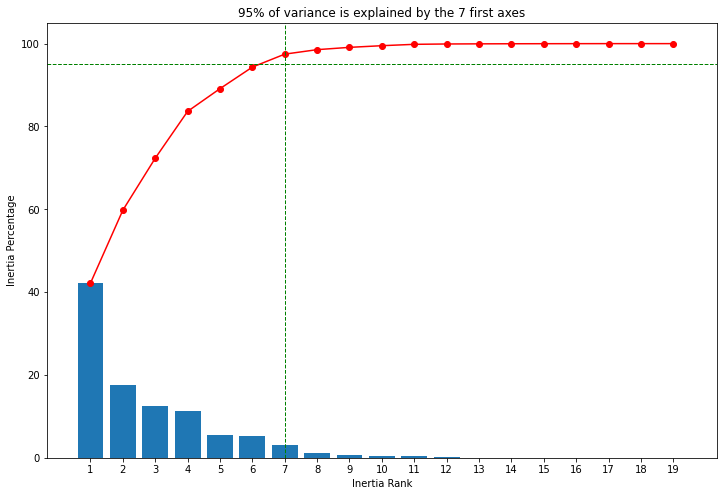

In [88]:
import matplotlib.pyplot as plt

# Explained variance
explained_variance = pca.named_steps['pca'].explained_variance_ratio_*100

# Plot of cumulated variance
plt.figure(figsize=(12,8))
plt.bar(np.arange(len(explained_variance))+1, explained_variance)

cumulated_variance = explained_variance.cumsum()
plt.plot(np.arange(len(explained_variance))+1, cumulated_variance,c="red",marker='o')
plt.axhline(y=95, linestyle="--",
            color="green",
            linewidth=1)

limit = 95
valid_idx = np.where(cumulated_variance >= limit)[0]
min_plans = valid_idx[cumulated_variance[valid_idx].argmin()]+1
plt.axvline(x=min_plans, linestyle="--",
            color="green",
            linewidth=1)

plt.xlabel("Inertia Rank")
plt.xticks(np.arange(len(explained_variance))+1)
plt.ylabel("Inertia Percentage")
plt.title("{0}% of variance is explained"
          " by the {1} first axes".format(limit,
                                             min_plans))
plt.show(block=False)

In [89]:
def display_correlation_circle(pcs, n_comp, pca, axis_ranks, labels=None):

    fig=plt.figure(figsize=(20,n_comp*5))
    count=1
    for d1, d2 in axis_ranks:
        if d2 <= n_comp:
            ax=plt.subplot(int(n_comp/2),2,count)
            ax.set_aspect('equal', adjustable='box')

            ax.set_xlim(-1,1)
            ax.set_ylim(-1,1)

            ax.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                       pcs[d1,:],pcs[d2,:],
                       angles='xy', scale_units='xy', scale=1,
                       color="grey", alpha=0.5)
            # et noms de variables
            for i,(x,y) in enumerate(pcs[[d1,d2]].T):
                ax.annotate(labels[i],(x,y),
                             ha='center', va='center',
                             fontsize='14',color="#099", alpha=0.8)

            #ajouter les axes
            ax.plot([-1,1],[0,0],linewidth=1, color='grey', ls='--')
            ax.plot([0,0],[-1,1],linewidth=1, color='grey', ls='--')

            circle = plt.Circle((0,0),1,color='#099',fill=False)
            ax.add_artist(circle)

            ax.set_xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            ax.set_ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            ax.set_title("Correlations circle (F{} et F{})".format(d1+1, d2+1))
            count+=1

    plt.suptitle("Circles of correlations for the {} first axes".format(n_comp),
                 y=.9, color="#098", fontsize=18)
    plt.show(block=False)

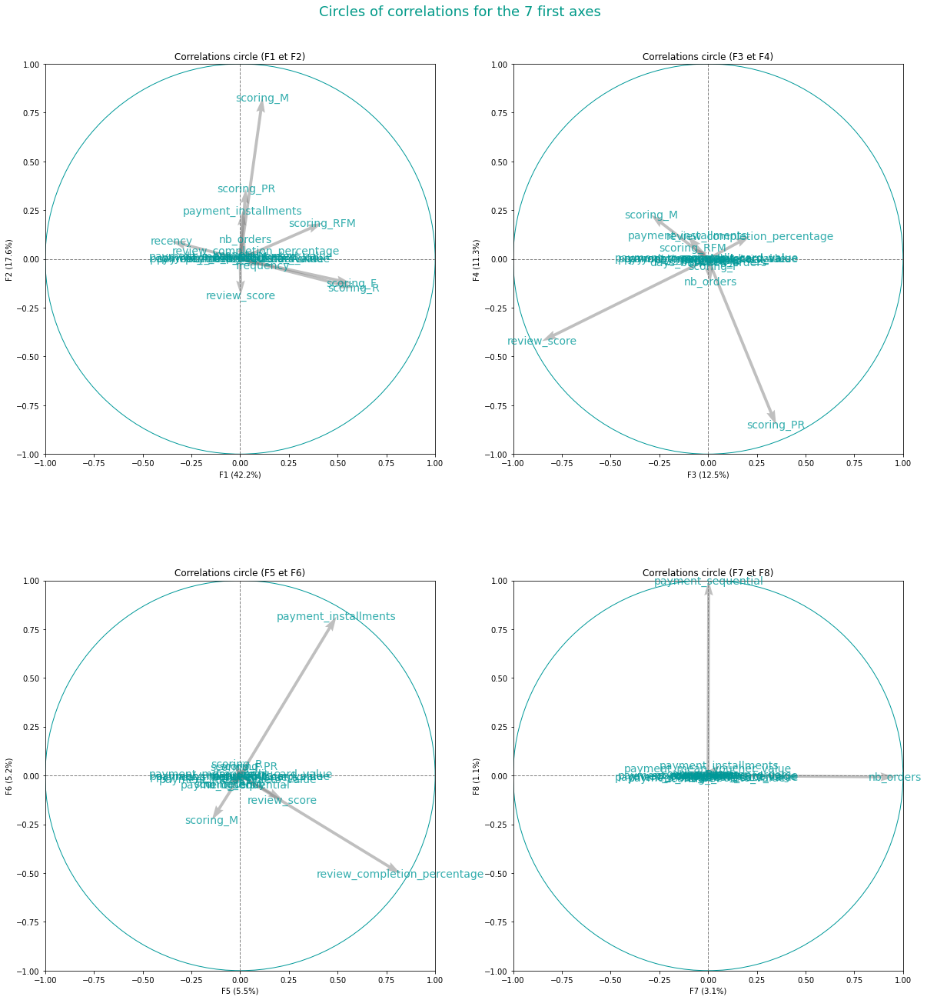

In [90]:
# Get the PCA components
pcs = pca.named_steps['pca'].components_

display_correlation_circle(pcs,
           7,
           pca.named_steps['pca'],
           [(0,1),(2,3), (4,5), (6,7)],
           labels = np.array(X.columns))

Let's store as dataframe the main components, this may improve the results !

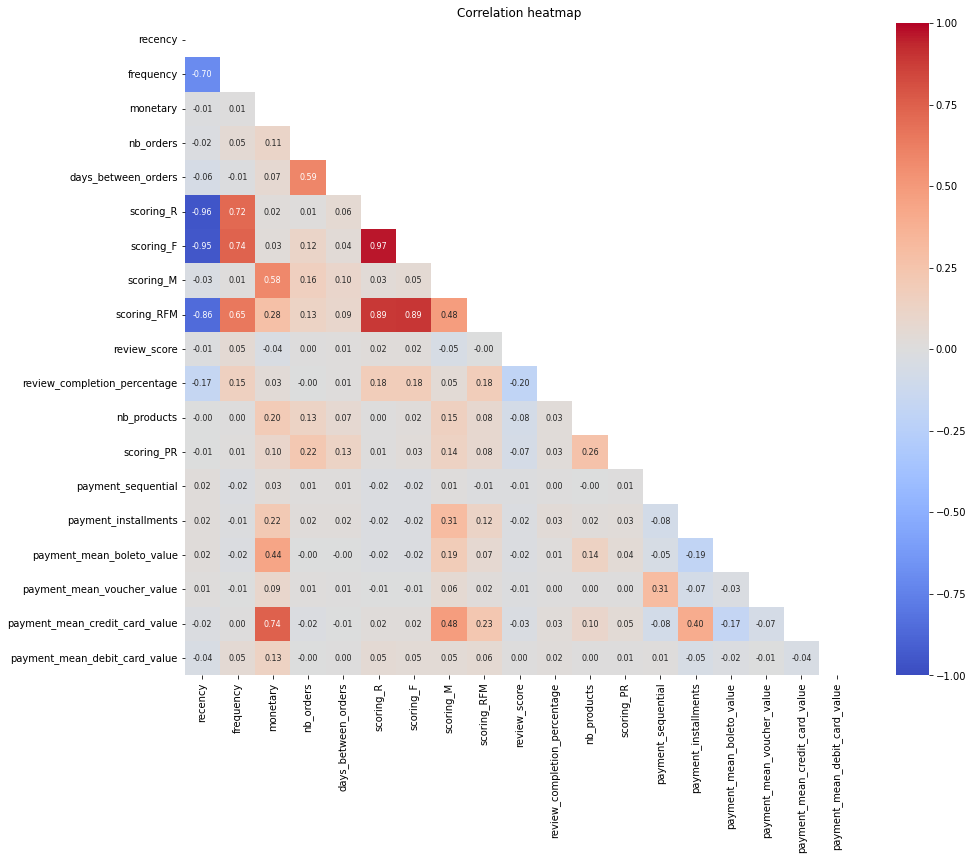

In [91]:
import seaborn as sns
corr = rfmsppl.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(15,12))
ax = sns.heatmap(corr, annot=True,
                 vmin=-1, vmax=1,
                 fmt=".2f", annot_kws={'size':8},
                 mask=mask,
                 center=0,
                 cmap="coolwarm")
plt.title("Correlation heatmap")
plt.show()

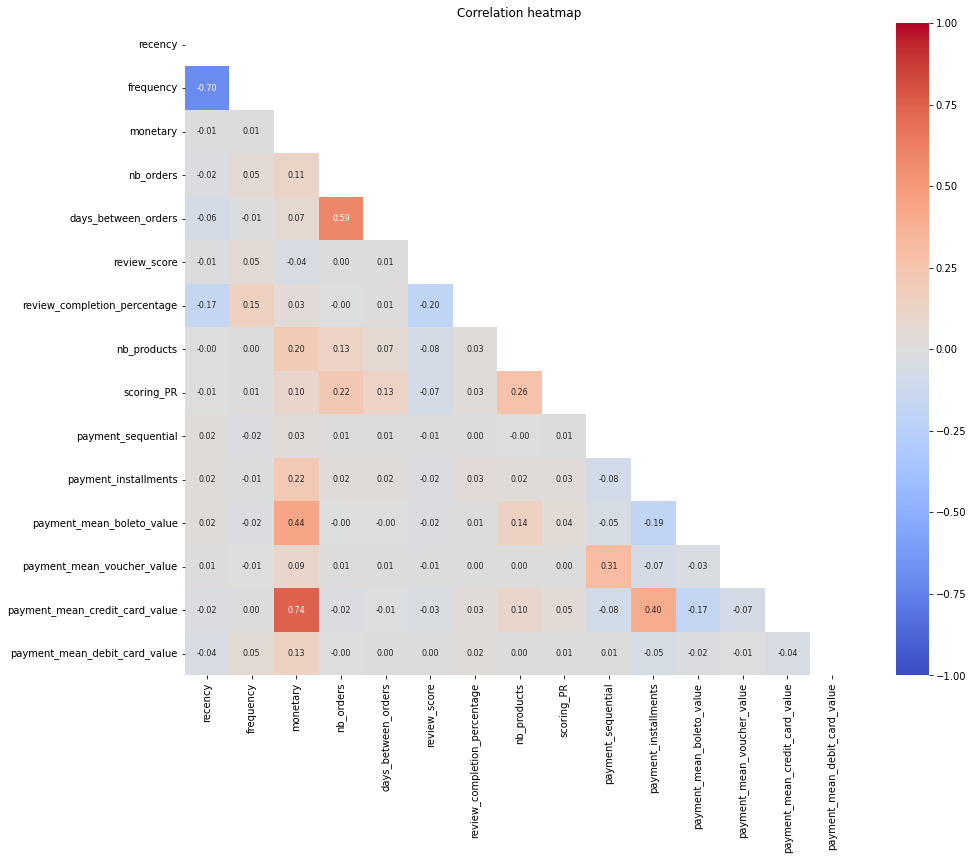

In [92]:
improved_df = rfmsppl.drop(columns=['scoring_R', 'scoring_F', 'scoring_M', 'scoring_RFM'])

corr_i = improved_df.corr()
mask = np.zeros_like(corr_i)
mask[np.triu_indices_from(mask)] = True
fig2, ax2 = plt.subplots(figsize=(15,12))
ax2 = sns.heatmap(corr_i, annot=True,
                 vmin=-1, vmax=1,
                 fmt=".2f", annot_kws={'size':8},
                 mask=mask,
                 center=0,
                 cmap="coolwarm")
plt.title("Correlation heatmap")
plt.show()

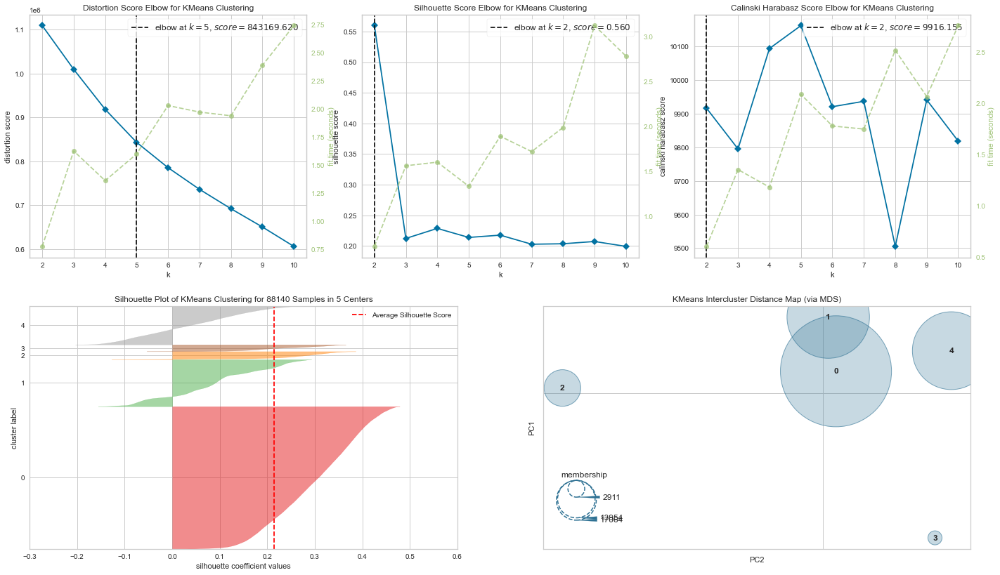

In [93]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
from sklearn.cluster import KMeans

scaler = StandardScaler()

def Kmeansplots(data):
    X = data.copy()
    numerical_features = list(data.select_dtypes(include=['int64','float64',
                                                          'uint8']).columns)
    preprocessor = ColumnTransformer([
        ('scaler', scaler, numerical_features)])

    plt.figure(figsize=(24, 14));ax1 = plt.subplot(2,3,1);ax2 = plt.subplot(2,3,2)
    ax3 = plt.subplot(2,3,3);ax4 = plt.subplot(2,2,3);ax5 = plt.subplot(2,2,4)

    visual_grid1 = [
        (Pipeline([("preprocessor", preprocessor),("kelbowvisualizer"
                                                   , KElbowVisualizer(KMeans(),K=(4,12),metric='distortion',
                                                                      ax=ax1))]),'kelbowvisualizer'),
        (Pipeline([("preprocessor", preprocessor),("kelbowvisualizer"
                                                   , KElbowVisualizer(KMeans(),K=(4,12),metric='silhouette',
                                                                      ax=ax2))]),'kelbowvisualizer'),
        (Pipeline([("preprocessor", preprocessor),("kelbowvisualizer"
                                                   , KElbowVisualizer(KMeans(),K=(4,12),metric='calinski_harabasz',
                                                                      ax=ax3))]),'kelbowvisualizer')
    ]

    i=0
    for viz in visual_grid1:
        viz[0].fit(X)
        if i==0:
            #Defining the best K by distortion method
            K = viz[0].named_steps['kelbowvisualizer'].elbow_value_
            i = i+1
        viz[0].named_steps[viz[1]].finalize()

    visual_grid2 = [(Pipeline([("preprocessor", preprocessor),("silhouettevisualizer",
                                                               SilhouetteVisualizer(KMeans(K,random_state=0),ax=ax4))]),
                     'silhouettevisualizer'),
                    (Pipeline([("preprocessor", preprocessor),("distancevisualizer",
                                                               InterclusterDistance(KMeans(K,random_state=0),ax=ax5))]),
                     'distancevisualizer')]
    for viz in visual_grid2:
        viz[0].fit(X)
        viz[0].named_steps[viz[1]].finalize()

    # KMeans Pipeline with best K
    kmeans_model = Pipeline([("preprocessor", preprocessor),
                             ("kmeans", KMeans(K,random_state=0))])
    kmeans_model.fit(X)
    # Kmeans labels
    kmeans_labels = kmeans_model.named_steps['kmeans'].labels_
    X["kmeans_label"] = kmeans_labels

    return X

X_0 = Kmeansplots(improved_df)